# Analysis for Figure3

In [650]:
1

1

In [3]:
import warnings
import os
import sys
import gc
import warnings
import anndata as ad
import scanpy as sc
import scanpy.external as sce
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import rapids_singlecell as rsc
import scanpy as sc
import cupyx as cpx
import pandas as pd
import numpy as np
import scipy.stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
import scib
import scib_metrics

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

sc.settings.verbosity = 3

print(f"CUDA used: {torch.cuda.is_available()}")

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/xla.py:18: DeprecationWarning: `ModuleAvailableCache` is a special case of `RequirementCache`. Please use `RequirementCache(module=...)` instead.
  from lightning.fabric.accelerators.tpu import _XLA_AVAILABLE, TPUAccelerator
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/__init__.py:36: DeprecationWarning: Deprecated call to `pkg_resources.declare_namespace('lightning.fabric')`.
Implementing implicit namespace packages (as specified in PEP 420) is preferred to `pkg_resources.declare_namespace`. See https://setuptools.pypa.io/en/latest/references/keywords.html#keyword-namespace-packages
  __import__("pkg_resources").declare_na

CUDA used: True


In [463]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [4]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    adata_file_path = os.path.join(tardis.config.io_directories["processed"], "cpa_GSM_new.h5ad")
    assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
    adata = ad.read_h5ad(adata_file_path)
    adata.X = adata.layers["counts"].copy()
    del adata.layers
    adata.obs.loc[adata.obs["dose"] == "0.0", "dose_val"] = 0.0
    d = {i: ind for ind, i in enumerate(sorted(adata.obs["dose"].astype(float).unique()))}
    adata.obs["dose_training"] = [d[float(i)] for i in adata.obs["dose"]]
    gc.collect()

In [5]:
display(d)

{0.0: 0, 0.1: 1, 0.5: 2, 1.0: 3, 5.0: 4, 10.0: 5, 50.0: 6, 100.0: 7}

In [6]:
adata.obs.value_counts(["dose_training", "dose", "dose_val"])

dose_training  dose   dose_val
3              1.0    0.010       2171
0              0.0    0.000       2155
1              0.1    0.001       1961
5              10.0   0.100       1940
2              0.5    0.005       1792
4              5.0    0.050       1790
6              50.0   0.500       1767
7              100.0  1.000       1235
dtype: int64

In [7]:
!ls /lustre/groups/ml01/workspace/kemal.inecik/tardis_data/models

braun			     run6.4_dataset_subset_age_4
braun_age-continuous	     run7
garcia			     sciplex-cpa_age_dose-continuous_1
garcia_sex_age_status	     sciplex-cpa_age_dose-continuous_1.2
he			     sciplex-cpa_age_dose-continuous_1.3
he_sex_age		     sciplex-cpa_age_dose-continuous_1.4
kanemaru		     sciplex-cpa_age_dose-continuous_2
kanemaru_sex_age_unit	     sciplex-cpa_age_dose-continuous_2.2
miller			     sciplex-cpa_age_dose-continuous_2.3
miller_age		     sciplex-cpa_age_dose-continuous_2.4
miller_sex		     suo
miller_sex_age		     suo_age
run10			     suo_age-continuous
run11			     suo_age-continuous_2
run12			     suo_organ
run13			     suo_platform
run6.1_dataset_subset_age_4  suo_sex
run6.2_dataset_subset_age_4  suo_sex_age_organ_platform
run6.3_dataset_subset_age_4


In [387]:
dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "sciplex-cpa_age_dose-continuous_1"
)
vae = tardis.MyModel.load(dir_path, adata=adata)

INFO     File                                                                                                      
         /lustre/groups/ml01/workspace/kemal.inecik/tardis_data/models/sciplex-cpa_age_dose-continuous_1/model.pt  
         already downloaded                                                                                        


In [388]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent, n_neighbors = 30)
sc.tl.umap(latent)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


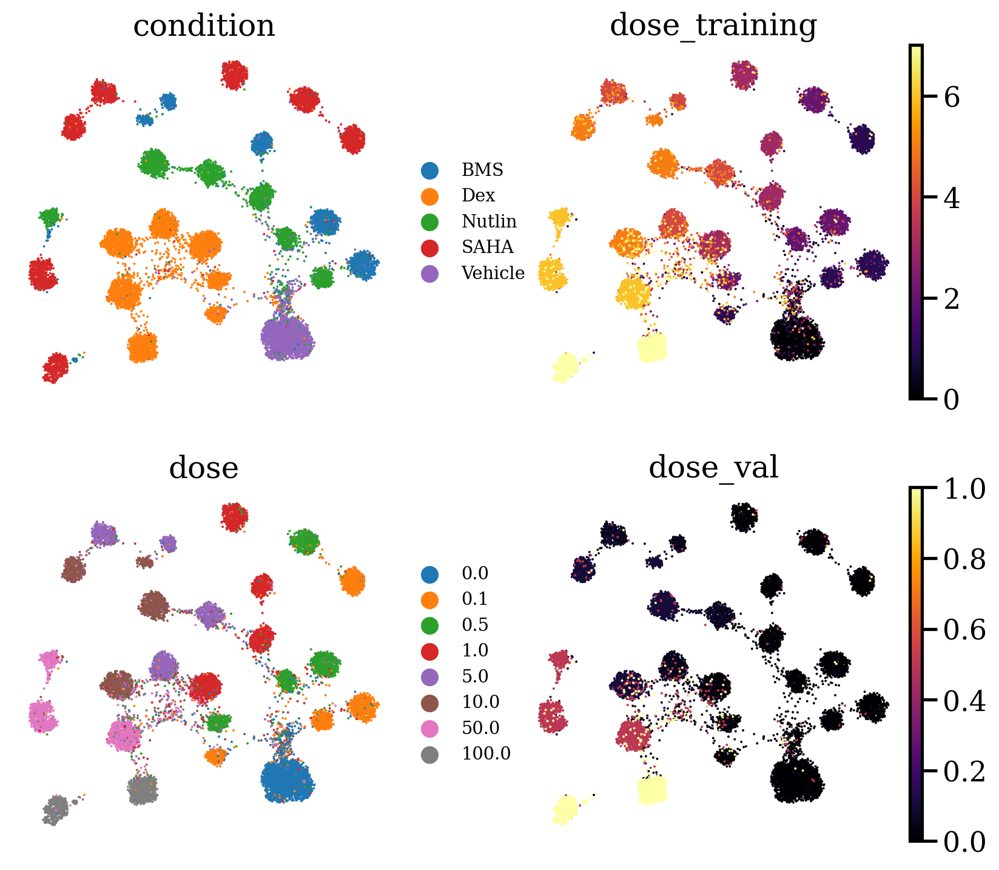

In [389]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent,
        color=["condition", "dose_training", "dose", "dose_val"],
        ncols=2,
        color_map="inferno",
        frameon=False,
        legend_fontsize="xx-small",
        show=False,
    )
    plt.show()
    # del latent
    # gc.collect()

In [390]:
from tardis._disentanglementmanager import DisentanglementManager

In [391]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("dose_training").reserved_latent_indices], obs=adata.obs.copy())
sc.pp.neighbors(latent, n_neighbors = 30)
sc.tl.umap(latent)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


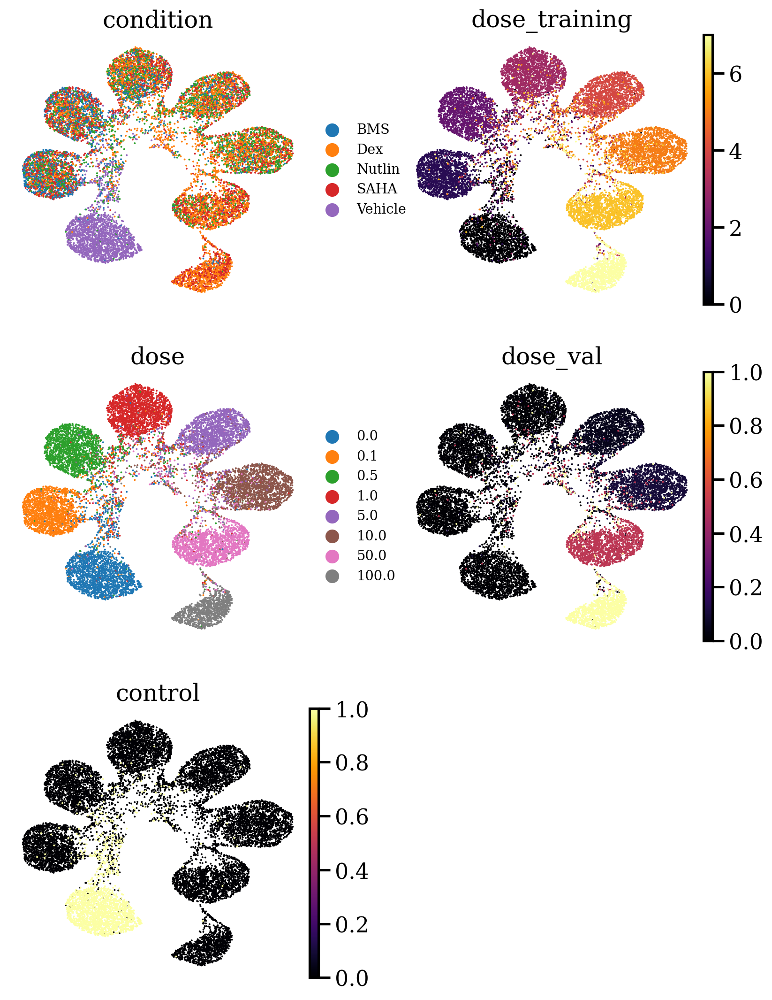

In [392]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent,
        color=["condition", "dose_training", "dose", "dose_val", "control"],
        ncols=2,
        color_map="inferno",
        frameon=False,
        legend_fontsize="xx-small",
        show=False,
    )
    plt.show()
    # del latent
    # gc.collect()

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


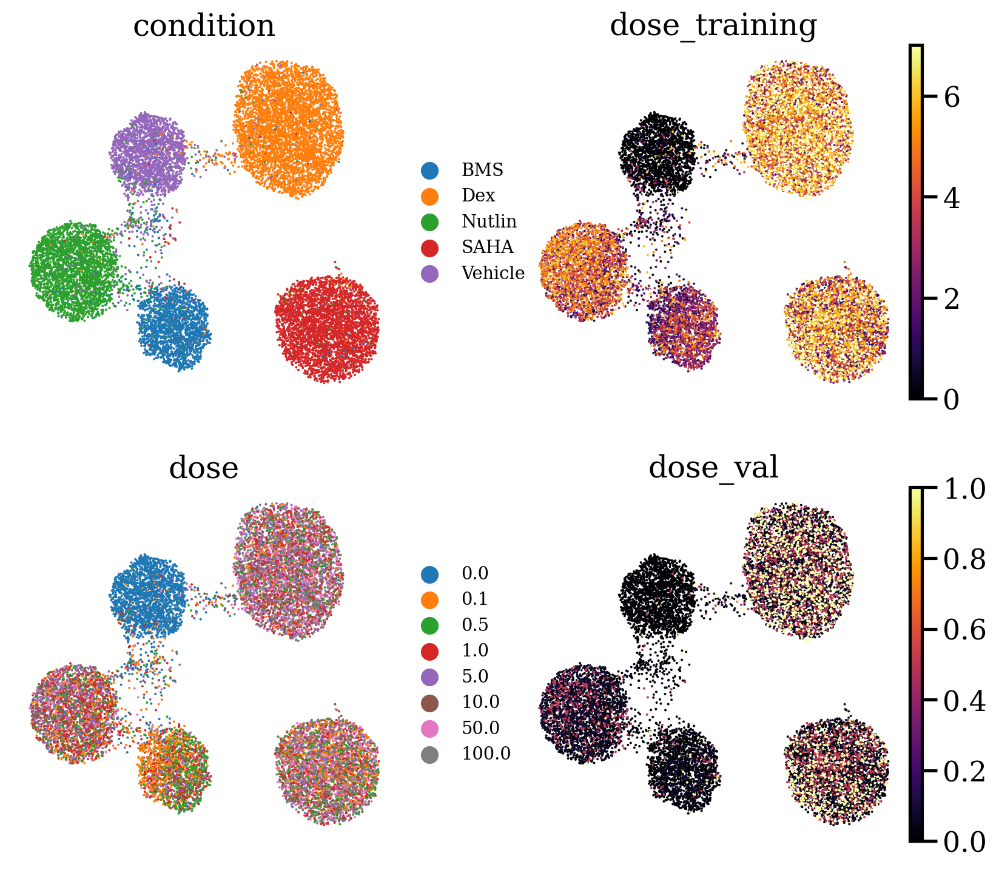

In [393]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("condition").reserved_latent_indices], obs=adata.obs.copy())
sc.pp.neighbors(latent, n_neighbors = 30)
sc.tl.umap(latent)
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent,
        color=["condition", "dose_training", "dose", "dose_val"],
        ncols=2,
        color_map="inferno",
        frameon=False,
        legend_fontsize="xx-small",
        show=False,
    )
    plt.show()
    # del latent
    # gc.collect()

In [394]:
batch_size_vae_metrics = 512

vae_metrics = {
    "reconstruction_error": vae.get_reconstruction_error(batch_size=batch_size_vae_metrics)['reconstruction_loss'],
    "elbo": vae.get_elbo(batch_size=batch_size_vae_metrics).item(),
    "r2_train": vae.get_reconstruction_r2(batch_size=batch_size_vae_metrics, indices=vae.train_indices),
    "r2_validation": vae.get_reconstruction_r2(batch_size=batch_size_vae_metrics, indices=vae.validation_indices),
}
for k, v in vae_metrics.items():
    print(k, v)

reconstruction_error -1883.0459118222943
elbo -1940.9459228515625
r2_train 0.9964994975549808
r2_validation 0.995275377220401


In [395]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("dose_training").reserved_latent_indices], obs=adata.obs.copy())
sc.pp.neighbors(latent, n_neighbors = 50)
sc.tl.umap(latent)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)


In [396]:
sc.tl.diffmap(latent, n_comps=50)

computing Diffusion Maps using n_comps=50(=n_dcs)
computing transitions
    finished (0:00:00)
    eigenvalues of transition matrix
    [1.         0.9994623  0.99908394 0.99885243 0.9985859  0.9982288
     0.99802953 0.9975717  0.97967404 0.9793435  0.9760815  0.9744562
     0.97247684 0.9719048  0.96846825 0.96698767 0.9661588  0.96527267
     0.9645915  0.96331424 0.9598467  0.958695   0.95681393 0.9525305
     0.95145977 0.9510753  0.94751704 0.94520885 0.9413093  0.93943006
     0.93917036 0.93544674 0.9346949  0.93155485 0.9293232  0.9280539
     0.9249245  0.92372507 0.922297   0.92176193 0.91997665 0.9181454
     0.91635936 0.91585124 0.91539603 0.9138885  0.9125028  0.91102904
     0.9100925  0.90806913]
    finished: added
    'X_diffmap', diffmap coordinates (adata.obsm)
    'diffmap_evals', eigenvalues of transition matrix (adata.uns) (0:00:01)


In [397]:
stem_mask = np.isin(latent.obs["dose_val"], latent.obs["dose_val"].min())
# opt_stem_id = np.argmin(latent.obsm["X_diffmap"][stem_mask, 10])
# root_id = np.arange(len(stem_mask))[stem_mask][opt_stem_id]
latent.uns["iroot"] = np.where(stem_mask)[0][2]

In [398]:
sc.tl.dpt(latent)

computing Diffusion Pseudotime using n_dcs=10
    finished: added
    'dpt_pseudotime', the pseudotime (adata.obs) (0:00:00)


In [399]:
latent.obs["c"] = (latent.obs["dose"] == 0.0).astype(str)

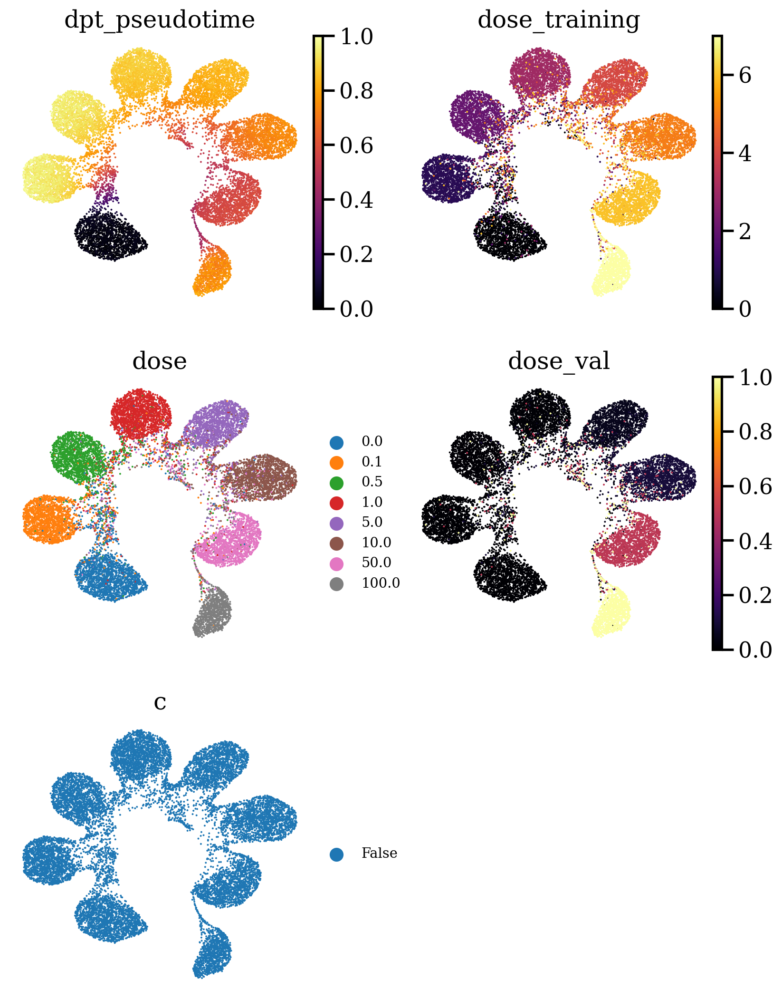

In [400]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent,
        color=["dpt_pseudotime", "dose_training", "dose", "dose_val", "c"],
        ncols=2,
        color_map="inferno",
        frameon=False,
        legend_fontsize="xx-small",
        show=False,
    )
    plt.show()

In [401]:
def paga(adata, groups="louvain"):
    """ """

    sc.pp.neighbors(adata)
    sc.tl.paga(adata, groups=groups)
    _ = sc.pl.paga_compare(adata, show=False)

    fig1, ax1 = plt.subplots()
    sc.pl.umap(adata, size=10, ax=ax1, show=False)
    sc.pl.paga(
        adata,
        pos=adata.uns["paga"]["pos"],
        show=False,
        node_size_scale=10,
        node_size_power=1,
        ax=ax1,
        text_kwds={"alpha": 0.5},
    )
    plt.show()


computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:00)
--> added 'pos', the PAGA positions (adata.uns['paga'])
--> added 'pos', the PAGA positions (adata.uns['paga'])


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  cax = scatter(


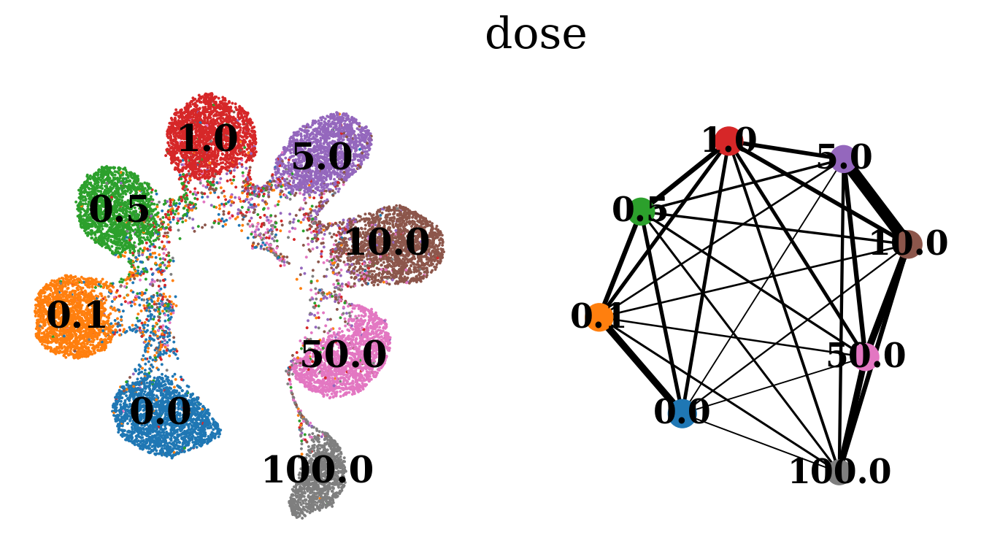

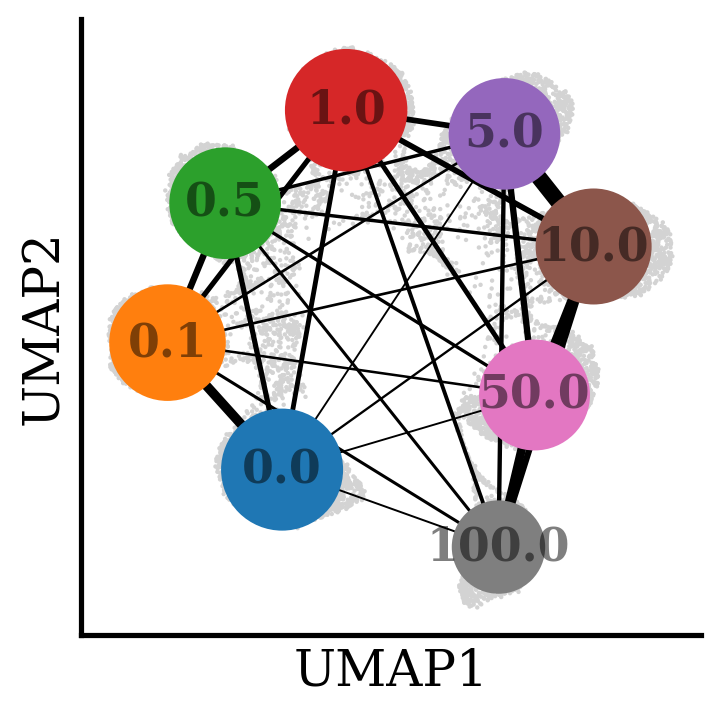

In [402]:
paga(latent, groups="dose")

In [403]:
latent

AnnData object with n_obs × n_vars = 14811 × 8
    obs: 'sample', 'size_factor', 'n.umi', 'hash_umis', 'pval', 'qval', 'top_to_second_best_ratio', 'top_oligo', 'drug', 'dose', 'vehicle', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'product_dose', 'louvain', 'dose_val', 'cell_type', 'drug_dose_name', 'cov_drug_dose_name', 'condition', 'control', 'split', 'dose_training', '_scvi_batch', '_scvi_labels', 'dpt_pseudotime', 'c'
    uns: 'neighbors', 'umap', 'diffmap_evals', 'iroot', 'dose_colors', 'c_colors', 'paga', 'dose_sizes'
    obsm: 'X_umap', 'X_diffmap'
    obsp: 'distances', 'connectivities'

--> added 'pos', the PAGA positions (adata.uns['paga'])


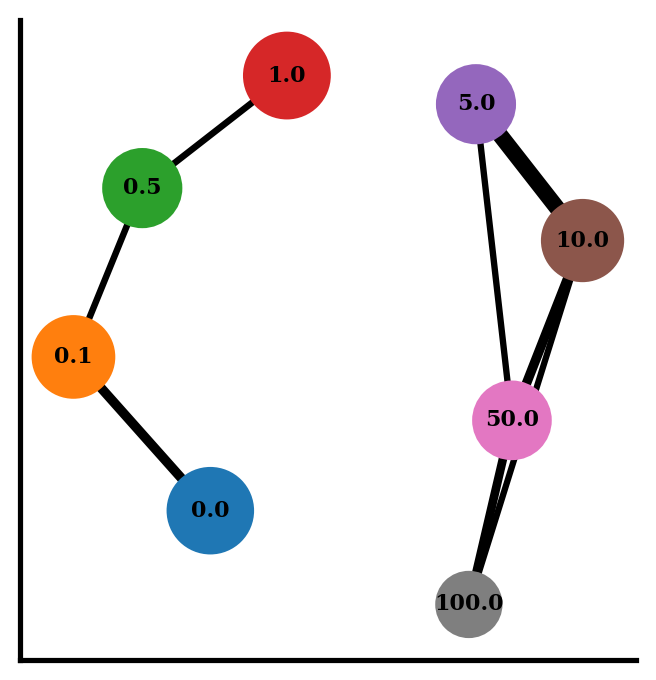

In [404]:
sc.pl.paga(
    latent,
    threshold=0.2,
    pos=latent.uns["paga"]["pos"],
    show=False,
    node_size_scale=5,
    node_size_power=1,
    text_kwds={"alpha": 1},
    fontsize=8,

)
plt.show()

In [405]:
latent

AnnData object with n_obs × n_vars = 14811 × 8
    obs: 'sample', 'size_factor', 'n.umi', 'hash_umis', 'pval', 'qval', 'top_to_second_best_ratio', 'top_oligo', 'drug', 'dose', 'vehicle', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'product_dose', 'louvain', 'dose_val', 'cell_type', 'drug_dose_name', 'cov_drug_dose_name', 'condition', 'control', 'split', 'dose_training', '_scvi_batch', '_scvi_labels', 'dpt_pseudotime', 'c'
    uns: 'neighbors', 'umap', 'diffmap_evals', 'iroot', 'dose_colors', 'c_colors', 'paga', 'dose_sizes'
    obsm: 'X_umap', 'X_diffmap'
    obsp: 'distances', 'connectivities'

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


--> added 'pos', the PAGA positions (adata.uns['paga'])


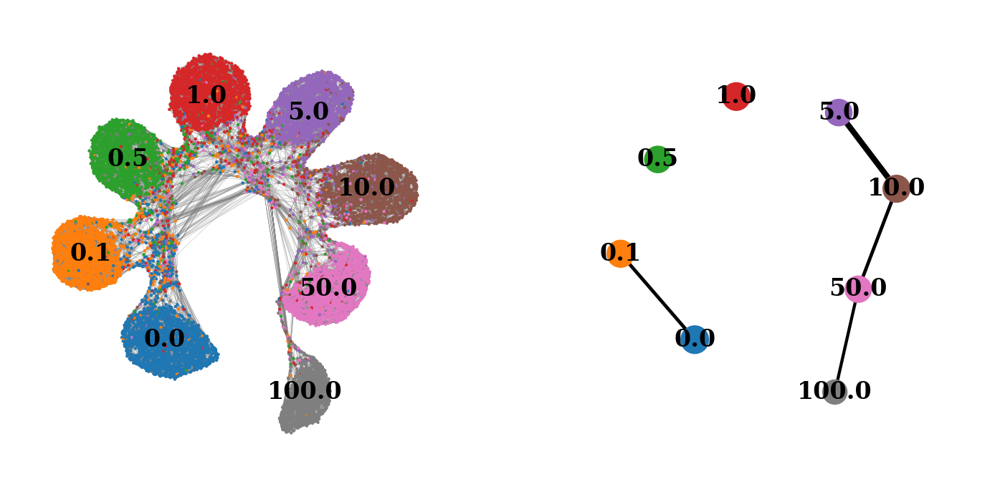

In [406]:
sc.pl.paga_compare(
    latent,
    threshold=0.23,
    title="",
    right_margin=0.2,
    size=10,
    edge_width_scale=0.5,
    legend_fontsize=12,
    fontsize=12,
    frameon=False,
    edges=True,
)

In [407]:
latent.uns["paga"]["connectivities"].A

array([[0.          , 0.3062711776, 0.1672350912, 0.1548854052,
        0.0601951141, 0.0743918483, 0.060839735 , 0.0624040022],
       [0.3062711776, 0.          , 0.2068083935, 0.1642445869,
        0.0839308454, 0.0856442905, 0.0813598413, 0.0976247645],
       [0.1672350912, 0.2068083935, 0.          , 0.2091007227,
        0.1101494805, 0.109544301 , 0.1064049678, 0.0977496863],
       [0.1548854052, 0.1642445869, 0.2091007227, 0.          ,
        0.181976614 , 0.1820972872, 0.1548390188, 0.1234936365],
       [0.0601951141, 0.0839308454, 0.1101494805, 0.181976614 ,
        0.          , 0.5151288454, 0.2026796131, 0.1397300729],
       [0.0743918483, 0.0856442905, 0.109544301 , 0.1820972872,
        0.5151288454, 0.          , 0.3041202732, 0.2008952794],
       [0.060839735 , 0.0813598413, 0.1064049678, 0.1548390188,
        0.2026796131, 0.3041202732, 0.          , 0.276068747 ],
       [0.0624040022, 0.0976247645, 0.0977496863, 0.1234936365,
        0.1397300729, 0.200895279

In [408]:
from scanpy._utils import moving_average

In [409]:
import mellon

normalizing counts per cell
    finished (0:00:00)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


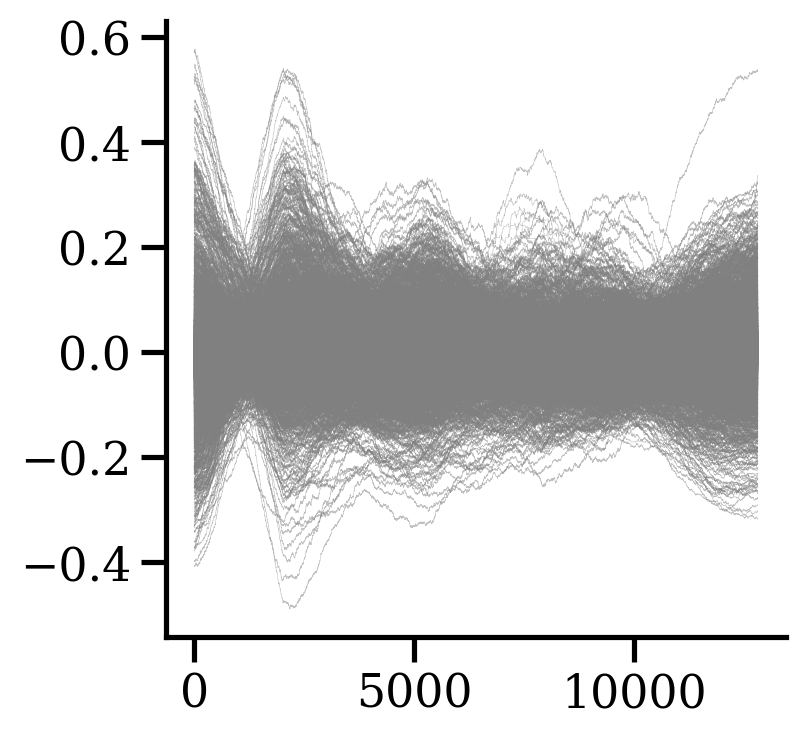

In [410]:
_adata = adata.copy()
_adata.obs = latent.obs.copy()
_adata.uns = latent.uns.copy()
_adata.obsm = latent.obsm.copy()
_adata.obsp = latent.obsp.copy()

sc.pp.normalize_total(_adata)
sc.pp.log1p(_adata)
sc.pp.scale(_adata)

_adata.obs["distance"] = _adata.obs["dpt_pseudotime"]
_adata.obs["clusters"] = _adata.obs["dose"]  # just a cosmetic change

_adata = _adata[_adata.obs["dpt_pseudotime"].sort_values().index,:]
arr = _adata.X

for i in range(4999):
    plt.plot(moving_average(arr[:,i], 2000), linewidth=0.2, color="gray", alpha=0.5)

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_utils.py:432: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + '_colors'] = colors_list
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/paga.py:1228: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  groups_axis.set_yticklabels(['', xlabel, ''], fontsize=ytick_fontsize)
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/paga.py:1277: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  anno_axis.set_yticklabels(['', anno, ''], fontsize=ytick_fontsize)


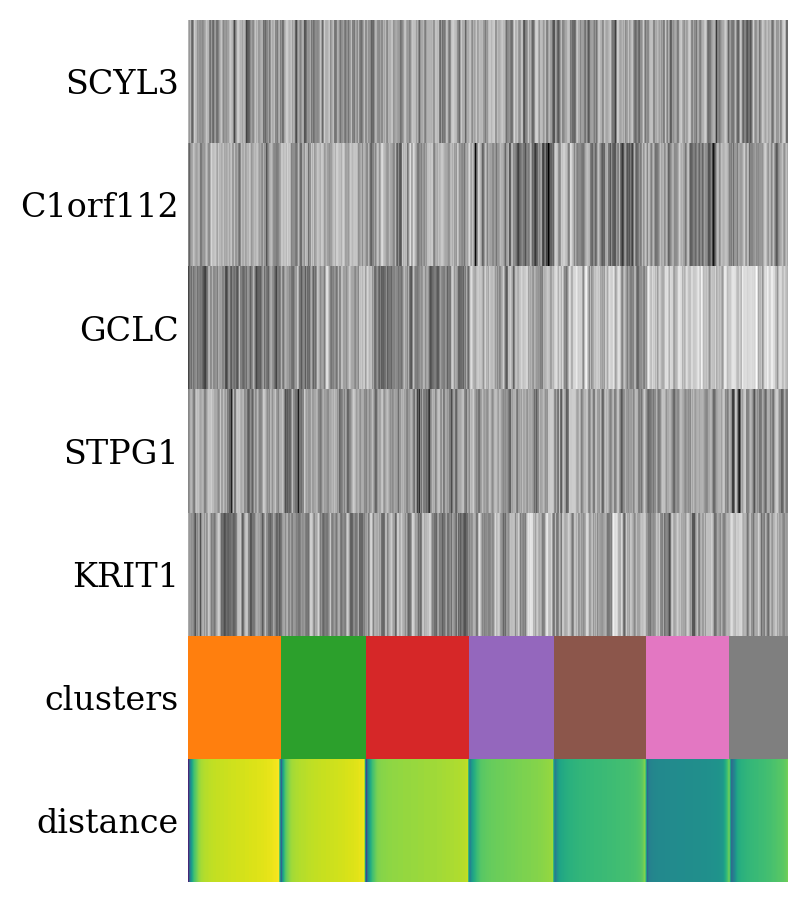

In [411]:
sc.pl.paga_path(
    _adata,
    ['0.1', '0.5', '1.0', '5.0', '10.0', '50.0', '100.0'],
    ['SCYL3', 'C1orf112', 'GCLC', 'STPG1', 'KRIT1'],
    show_node_names=False,
    ytick_fontsize=12,
    left_margin=0.15,
    n_avg=50,
    annotations=["distance"],
    show_yticks=True,
    show_colorbar=False,
    color_map="Greys",
    groups_key="clusters",
    color_maps_annotations={"distance": "viridis"},
    return_data=True,
    show=False,
);

In [412]:
import numpy as np

import matplotlib
import matplotlib.pyplot as plt

from sklearn.cluster import k_means
import palantir
import mellon
import scanpy as sc

import warnings
from numba.core.errors import NumbaDeprecationWarning

In [413]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("dose_training").reserved_latent_indices], obs=adata.obs.copy())

In [414]:
sc.tl.pca(latent, n_comps=7)

computing PCA
    with n_comps=7
    finished (0:00:00)


In [415]:
%%time
dm_res = palantir.utils.run_diffusion_maps(latent, pca_key="X_pca", n_components=20)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
CPU times: user 11.5 s, sys: 3.9 s, total: 15.4 s
Wall time: 2.59 s


In [416]:
%%time
model = mellon.DensityEstimator()
log_density = model.fit_predict(latent.obsm["DM_EigenVectors"])

predictor = model.predict

latent.obs["mellon_log_density"] = log_density
latent.obs["mellon_log_density_clipped"] = np.clip(
    log_density, *np.quantile(log_density, [0.05, 1])
)

[2024-04-26 12:57:31,127] [INFO    ] Using sparse Gaussian Process since n_landmarks (5,000) < n_samples (14,811) and rank = 1.0.
[2024-04-26 12:57:31,128] [INFO    ] Computing nearest neighbor distances.
[2024-04-26 12:57:32,292] [INFO    ] Using embedding dimensionality d=20. Use d_method="fractal" to enable effective density normalization.
[2024-04-26 12:57:32,303] [INFO    ] Using covariance function Matern52(ls=0.013513329933518522).
[2024-04-26 12:57:32,304] [INFO    ] Computing 5,000 landmarks with k-means clustering.
[2024-04-26 12:57:38,089] [INFO    ] Using rank 5,000 covariance representation.
[2024-04-26 12:57:39,763] [INFO    ] Running inference using L-BFGS-B.
[2024-04-26 12:57:46,477] [INFO    ] Computing predictive function.
CPU times: user 3min 28s, sys: 9.02 s, total: 3min 37s
Wall time: 15.4 s


In [417]:
sc.pp.neighbors(latent, n_neighbors = 15)
sc.tl.umap(latent)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


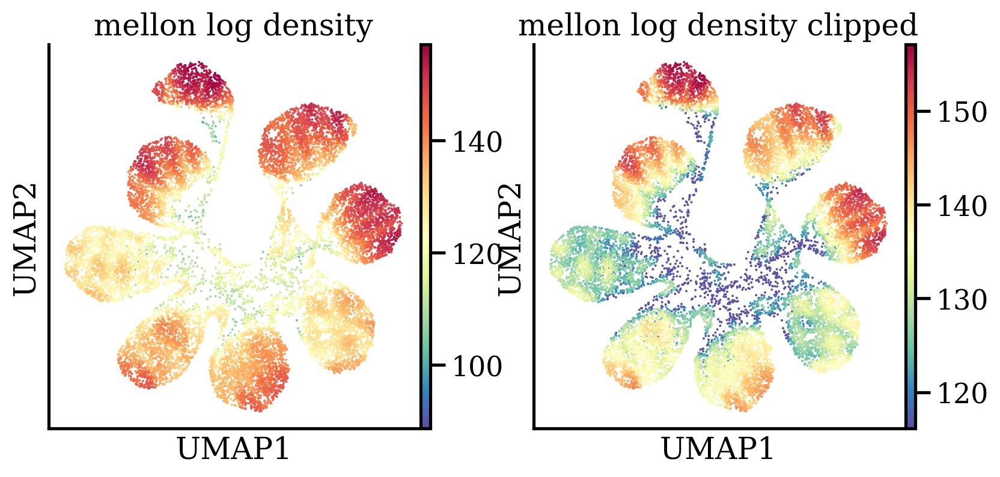

In [418]:
sc.pl.scatter(
    latent, color=["mellon_log_density", "mellon_log_density_clipped"], basis="umap"
)

In [419]:
high_density_index = latent.obs[latent.obs["mellon_log_density"]>120].index

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.violinplot(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_anndata.py:839: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  ax = sns.violinplot(


<Axes: ylabel='mellon_log_density'>

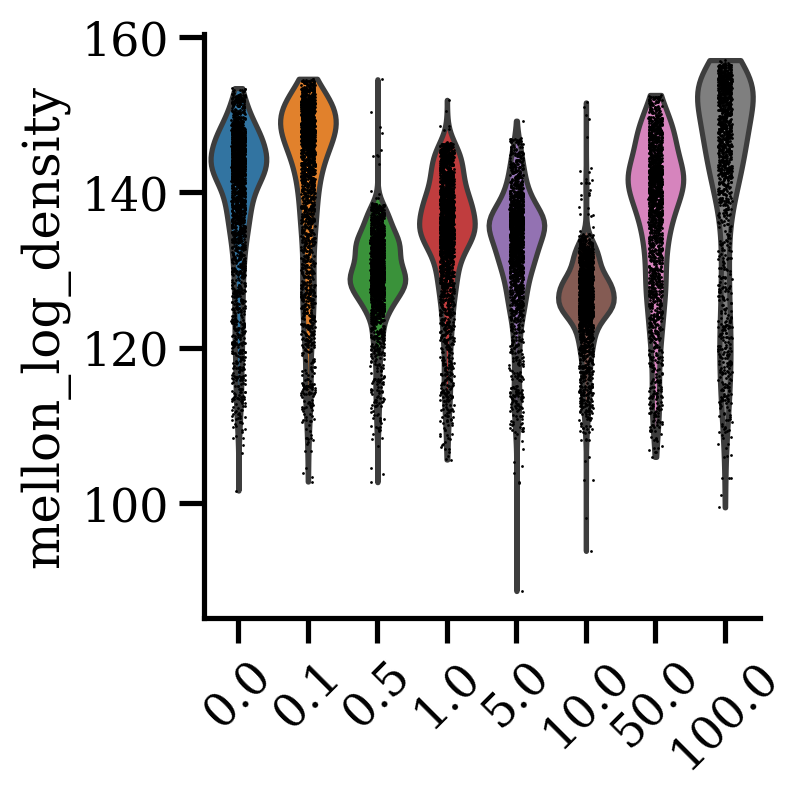

In [420]:
sc.pl.violin(latent, "mellon_log_density", "dose", rotation=45, show=False)

In [914]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("dose_training").reserved_latent_indices], obs=adata.obs.copy())
sc.tl.pca(latent, n_comps=7)

computing PCA
    with n_comps=7
    finished (0:00:00)


In [422]:
# latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("dose_training").reserved_latent_indices], obs=adata.obs.copy())
# latent = latent[high_density_index]
# sc.tl.pca(latent, n_comps=7)

In [423]:
dm_res = palantir.utils.run_diffusion_maps(latent, n_components=3)
ms_data = palantir.utils.determine_multiscale_space(latent)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)


In [915]:
sc.pp.neighbors(latent)
sc.tl.umap(latent)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)


In [425]:
# imputed_X = palantir.utils.run_magic_imputation(latent)

In [426]:
latent

AnnData object with n_obs × n_vars = 14811 × 8
    obs: 'sample', 'size_factor', 'n.umi', 'hash_umis', 'pval', 'qval', 'top_to_second_best_ratio', 'top_oligo', 'drug', 'dose', 'vehicle', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'product_dose', 'louvain', 'dose_val', 'cell_type', 'drug_dose_name', 'cov_drug_dose_name', 'condition', 'control', 'split', 'dose_training', '_scvi_batch', '_scvi_labels'
    uns: 'pca', 'DM_EigenValues', 'neighbors', 'umap'
    obsm: 'X_pca', 'DM_EigenVectors', 'DM_EigenVectors_multiscaled', 'X_umap'
    varm: 'PCs'
    obsp: 'DM_Kernel', 'DM_Similarity', 'distances', 'connectivities'

In [427]:
start_cell = latent.obs.index[np.where([latent.obs["dose_val"] == latent.obs["dose_val"].min()])[1]][0]
end_cell = latent.obs.index[np.where([latent.obs["dose_val"] == latent.obs["dose_val"].max()])[1]][0]

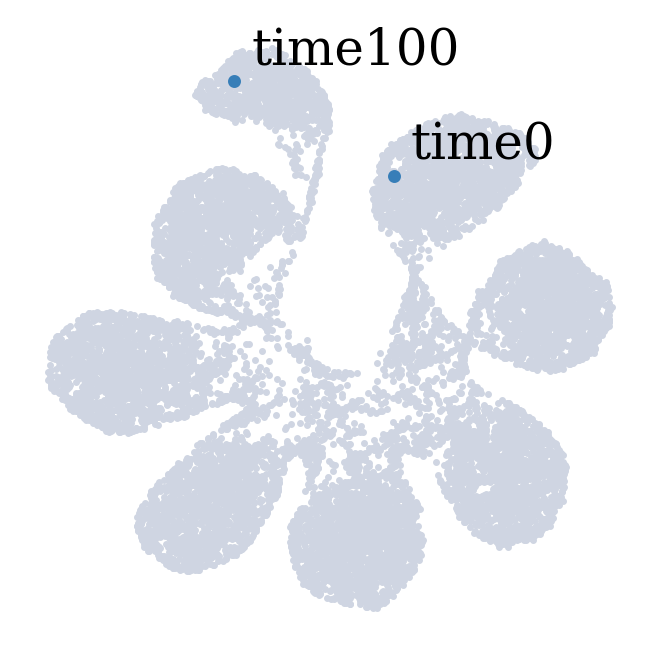

In [428]:
terminal_states = pd.Series(
    ["time0", "time100"],
    index=[start_cell, end_cell],
)

palantir.plot.highlight_cells_on_umap(latent, terminal_states)
plt.show()

(<Figure size 900x300 with 3 Axes>,
 {0: <Axes: title={'center': 'Component 0'}>,
  1: <Axes: title={'center': 'Component 1'}>,
  2: <Axes: title={'center': 'Component 2'}>})

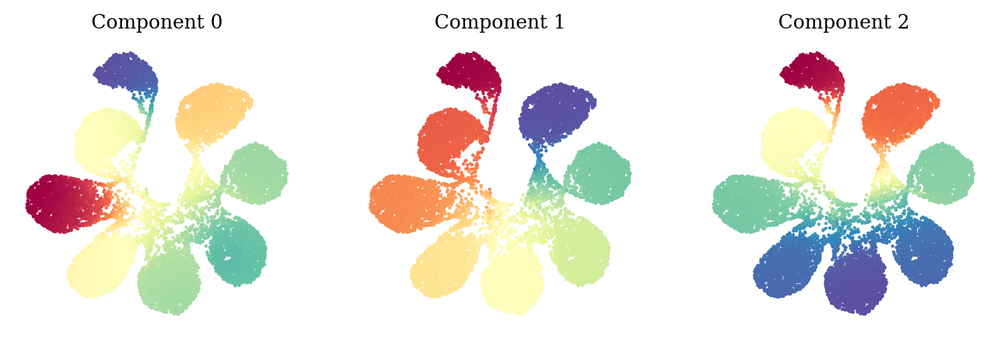

In [429]:
palantir.plot.plot_diffusion_components(latent)

In [430]:
pr_res = palantir.core.run_palantir(
    latent, start_cell, knn=15, terminal_states=terminal_states
)

Sampling and flocking waypoints...
Time for determining waypoints: 0.08661561806996664 minutes
Determining pseudotime...
Shortest path distances using 15-nearest neighbor graph...
Time for shortest paths: 0.08922787110010783 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


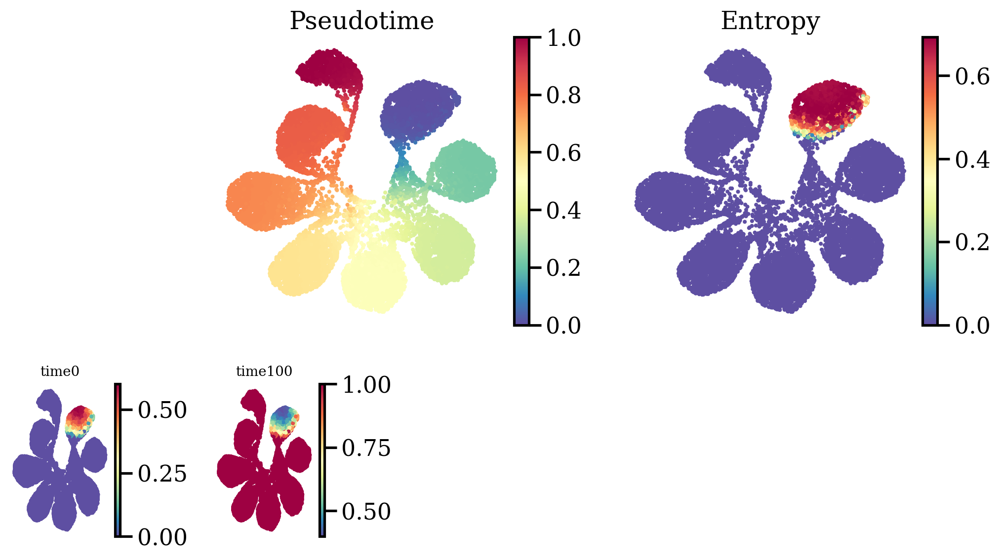

In [431]:
palantir.plot.plot_palantir_results(latent, s=2)
plt.show()

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


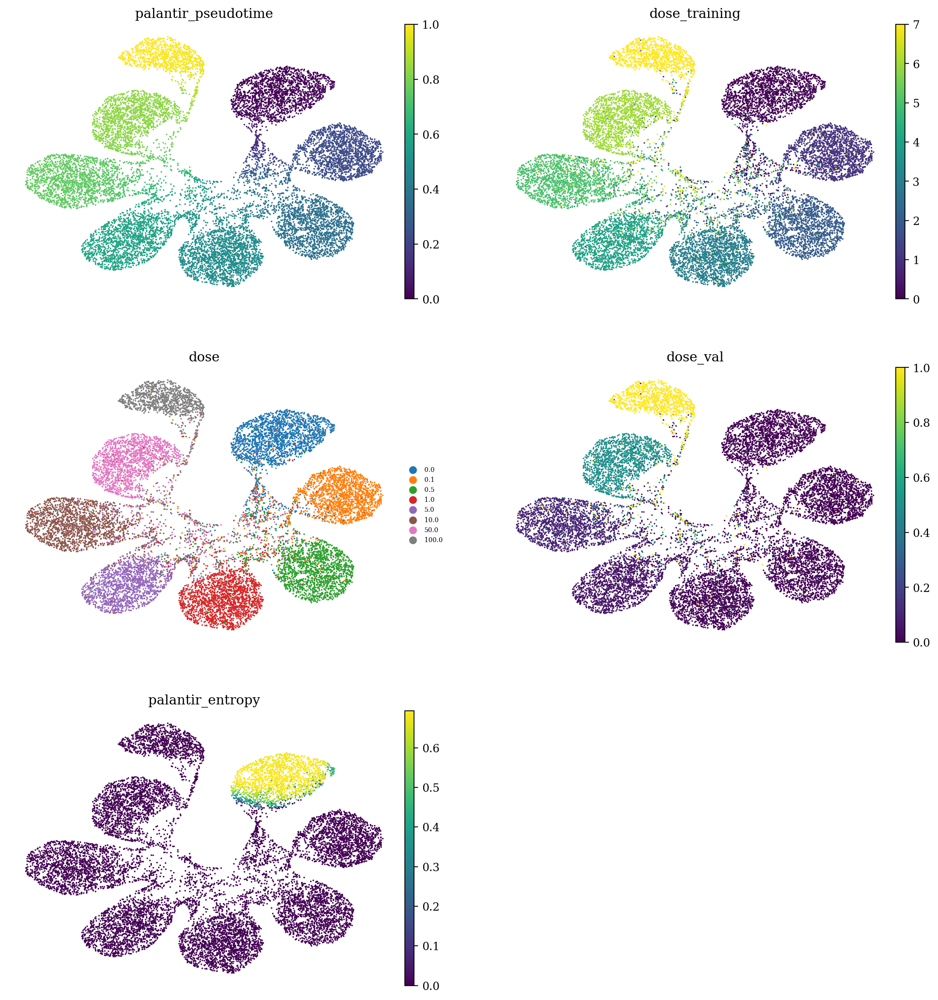

In [627]:
sc.pl.umap(
    latent,
    color=["palantir_pseudotime", "dose_training", "dose", "dose_val", "palantir_entropy"],
    ncols=2,
    color_map="viridis",
    frameon=False,
    legend_fontsize="xx-small",
    show=False,
)
plt.show()

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


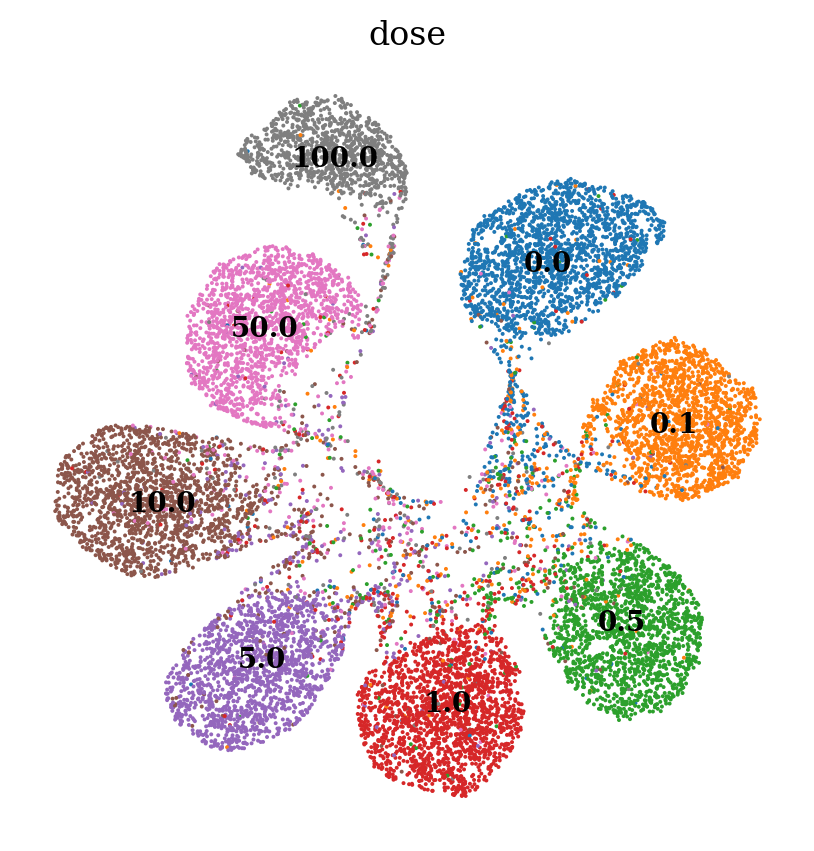

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


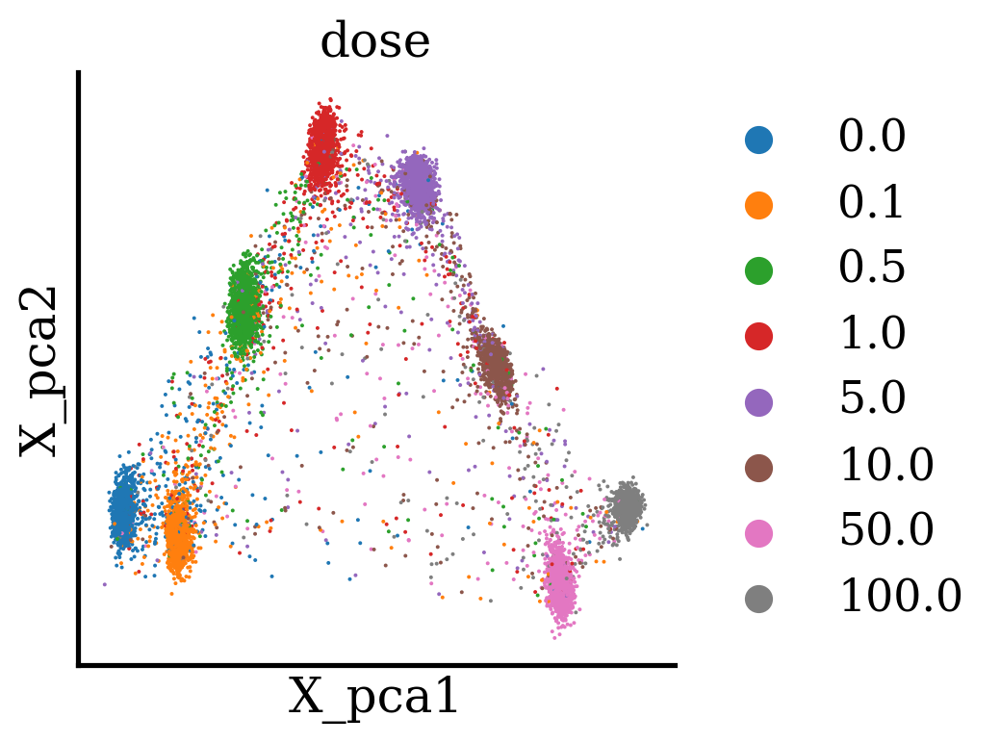

In [433]:
sc.pl.embedding(
    latent,
    basis="X_pca",
    color="dose"
)

In [434]:
latent.obs["palantir_pseudotime"]

index
A01_A01_RT_390    0.050189
A01_A01_RT_396    0.830650
A01_A01_RT_400    0.005997
A01_A01_RT_401    0.007798
A01_A01_RT_402    0.397799
                    ...   
H12_B02_RT_745    0.484976
H12_B02_RT_750    0.829630
H12_B02_RT_752    0.231622
H12_B02_RT_753    0.226324
H12_B02_RT_761    0.756986
Name: palantir_pseudotime, Length: 14811, dtype: float64

<Axes: xlabel='dose', ylabel='palantir_pseudotime'>

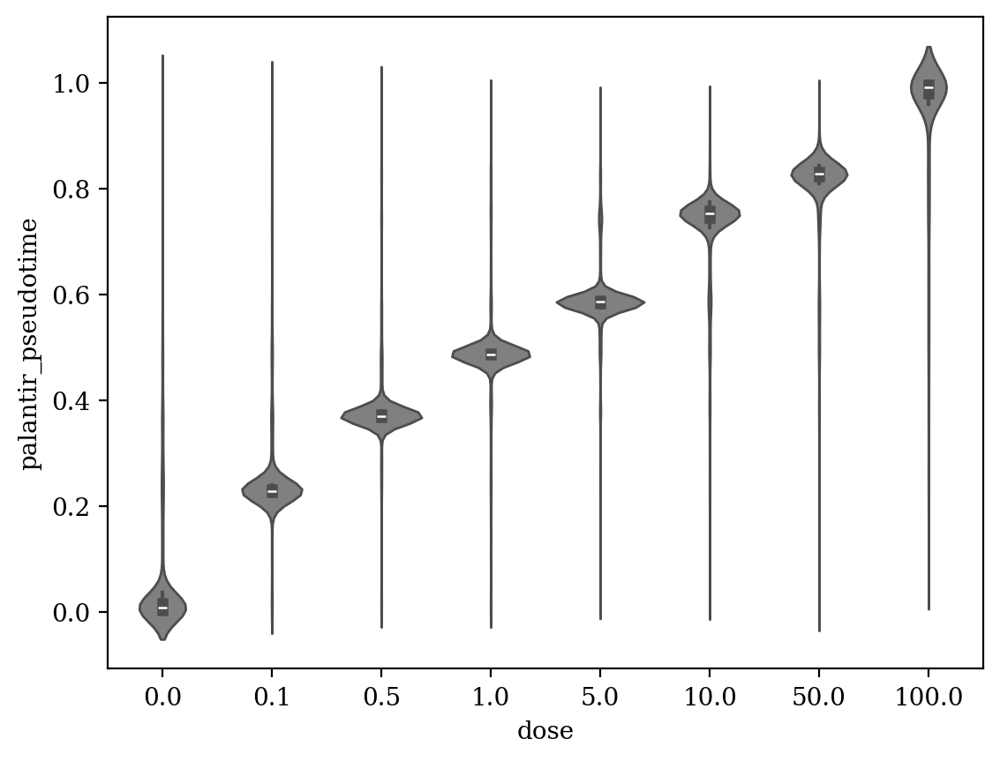

In [626]:
sns.violinplot(data=latent.obs, x="dose", y="palantir_pseudotime", linewidth=1, color="gray")

In [478]:
from tardis._modelplotting import ModelPlotting

In [507]:
hist_data[heights.index(peak_height)].get_x() + hist_data[heights.index(peak_height)].get_width() / 2

-7.675300605595112

In [514]:
heights.index(peak_height)

3

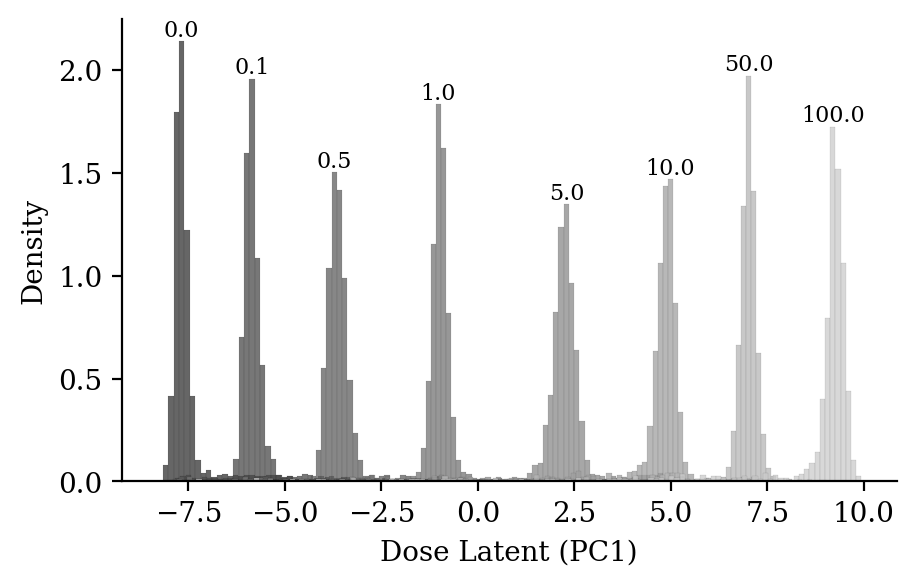

In [809]:
plt.figure(figsize=(5,3))
bins = 128
doses = sorted(latent.obs["dose"].astype(float).unique())
palette = ModelPlotting.generate_gray_tones(len(doses))
for ind, d in enumerate(doses):
    d = str(d)
    __latent = latent[latent.obs["dose"] == d]
    ax = sns.histplot(__latent.obsm["X_pca"][:, 0], bins=bins, stat="density", label=d, color=palette[ind], linewidth=0.025)

    # Calculate histogram data manually to find the peak
    data = __latent.obsm["X_pca"][:, 0]
    counts, bin_edges = np.histogram(data, bins=bins, density=True)
    max_index = np.argmax(counts)  # Index of the peak
    max_value = counts[max_index]  # Peak value
    max_bin_center = (bin_edges[max_index] + bin_edges[max_index + 1]) / 2  # Center of the bin
    
    # Annotate the peak
    plt.text(max_bin_center, max_value, d, horizontalalignment='center', verticalalignment='bottom', fontsize=8)
    
plt.gca().set_xlabel("Dose Latent (PC1)")
sns.despine()
plt.show()

In [695]:
 np.log(float(name))/2

2.302585092994046

In [917]:
plt.figure(figsize=(4,4))
latent.obs["pca1"] = latent.obsm["X_pca"][:, 0].copy()
latent.obs["dose_continuous"] = latent.obs["dose"].astype(float)
palette = ModelPlotting.generate_gray_tones(len(latent.obs["dose_continuous"].unique()))

# Scatter plot
ax = sns.scatterplot(data=latent.obs, x="pca1", y="palantir_pseudotime", s=10, alpha=0.5, linewidth=0.1, hue="dose_continuous", palette=palette)

# Calculate means for each dose and annotate
groups = latent.obs.groupby('dose_continuous')
for name, group in groups:
    mean_pca1 = group['pca1'].mean()
    mean_pseudotime = group['palantir_pseudotime'].mean()
    
    # Find non-overlapping positions for text annotations
    # Adjust these offsets based on your data's distribution and scale        
    text_pos_x = mean_pca1 + np.std(latent.obs["pca1"]) / 2 - 0.75
    text_pos_y = mean_pseudotime + np.std(latent.obs["palantir_pseudotime"]) / 2
    
    ax.annotate(f'{(name if float(name) <10 else int(name))}', xy=(mean_pca1, mean_pseudotime), xytext=(text_pos_x, mean_pseudotime),
                 arrowprops=dict(facecolor='black', arrowstyle='-', connectionstyle='arc3', lw=0.5), ha='left', va='center', fontsize=8)

sns.despine()
plt.xlabel("Dose Latent (PC1)")
plt.ylabel("Palantir Pseudotime")
ax.get_legend().remove()
plt.show()


ValueError: Could not interpret value `palantir_pseudotime` for `y`. An entry with this name does not appear in `data`.

<Figure size 400x400 with 0 Axes>

In [918]:
a=sorted(latent.uns.keys())
for i in a:
    del latent.uns[i]

/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


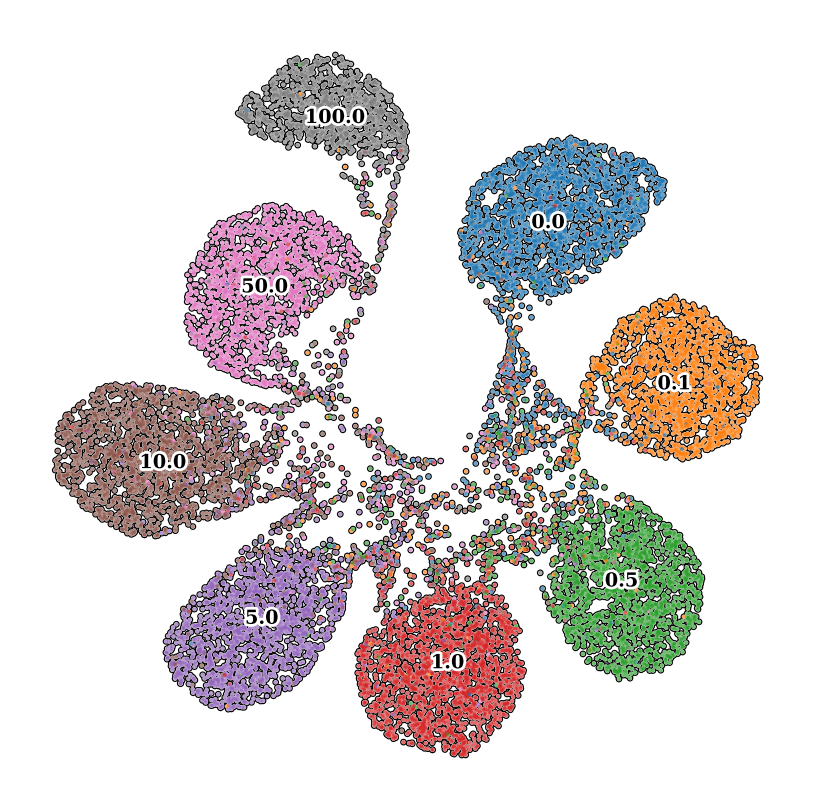

In [919]:
plt.figure(figsize=(5,5))
sc.pl.umap(
    latent,
    color=["dose"],
    ncols=2,
    frameon=False,
    legend_fontsize="x-small",
    show=False,
    ax=plt.gca(),
    legend_loc="on data",
    legend_fontweight="semibold",
    legend_fontoutline=2,
    title="",
    add_outline=True,
)
plt.show()

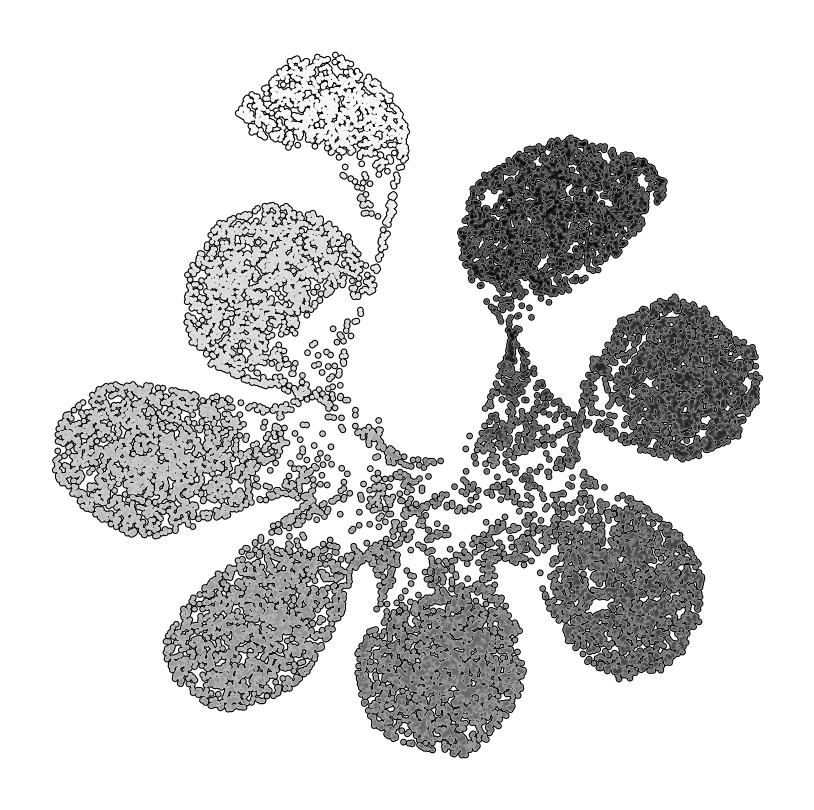

In [889]:
plt.figure(figsize=(5,5))
sc.pl.umap(
    latent,
    color=["pca1"],
    ncols=2,
    color_map="gray",
    colorbar_loc=None,
    frameon=False,
    legend_fontsize="x-small",
    show=False,
    ax=plt.gca(),
    legend_loc="on data",
    legend_fontweight="semibold",
    legend_fontoutline=2,
    title="",
    add_outline=True,
)
plt.show()

In [920]:
_adata = adata.copy()
_adata.obs = latent.obs.copy()
_adata.uns = latent.uns.copy()
_adata.obsm = latent.obsm.copy()
_adata.obsp = latent.obsp.copy()

_adata.X = vae.get_normalized_expression().values
sc.pp.scale(_adata)

_adata = _adata[_adata.obs["pca1"].sort_values().index,:]
_adata = _adata[_adata.obs["condition"] == "Nutlin"]
zzarr = _adata.X
zzarr.shape, _adata.shape

((2760, 4999), (2760, 4999))

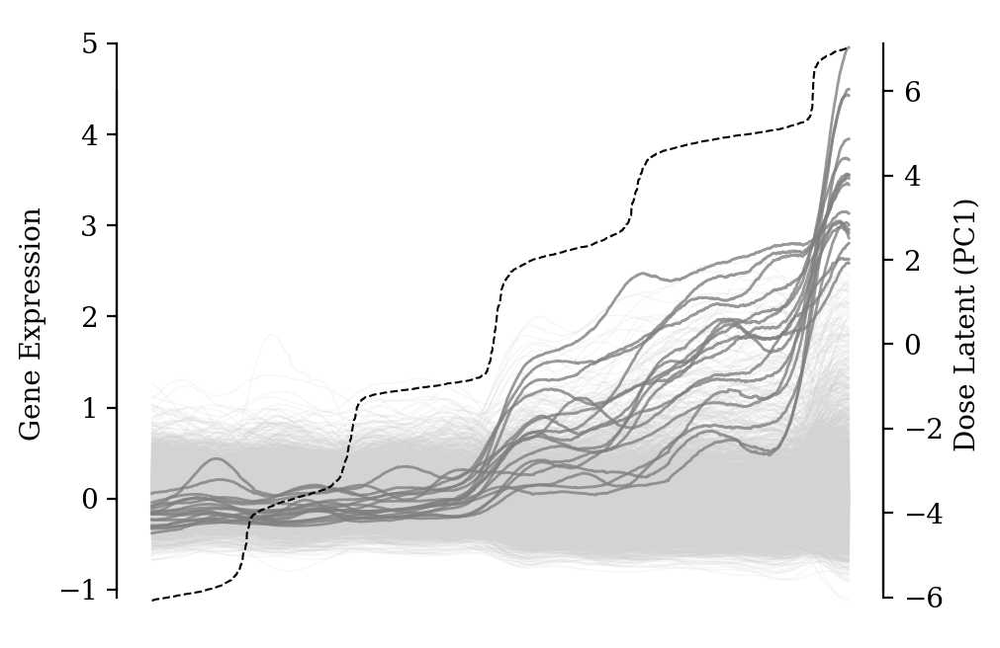

(['MAST4',
  'TP53I3',
  'GALE',
  'CDKN1A',
  'GDF15',
  'NINJ1',
  'FAM104A',
  'MDM2',
  'FAM129A',
  'GRIP2',
  'NPAS3',
  'FDXR',
  'SLFN5',
  'AXL',
  'PHLDA3',
  'NUPR1',
  'GPX1'],
 [0.9755510546899107, 98.0, 2.0])

In [921]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import norm
from scipy.signal import convolve
from scipy.signal.windows import gaussian

# Constants
THR = 2.5  # Threshold for filtering gene expression
GENE = 4999  # Number of genes
MAC = 2**8  # Window size for moving average calculation

cumulative_probability = norm.cdf(2.25)
confidence_interval = 2 * cumulative_probability - 1
high_confidence = round(confidence_interval, 2) * 100
low_confidence = 100 - high_confidence

# Creating a Gaussian window
window = gaussian(MAC, std=int(MAC/4))
window /= window.sum()

# Calculating the length of the convolution output for moving average
output_length = len(zzarr) - MAC + 1

# Creating a boolean mask for slicing the array
mask = np.zeros(len(zzarr), dtype=bool)
mask[int((MAC - 1)/2):int((MAC - 1)/2) + output_length] = True

# Initializing the plot with specified figure size
plt.figure(figsize=(5, 4))
texts = []  # List to store gene names that are prominently visible

# First pass: Plot the moving average for each gene expression array where the values are within the threshold
for i in range(GENE):
    ma = convolve(zzarr[:, i], window, mode='valid')
    sign = np.all((THR > ma[-1]) & (-THR < ma[-1]))
    if sign:
        plt.plot(ma, linewidth=0.5, color="lightgray", alpha=0.2)

# Second pass: Plot and highlight gene expressions that exceed the threshold
for i in range(GENE):
    ma = convolve(zzarr[:, i], window, mode='valid')
    sign = np.all((THR > ma[-1]) & (-THR < ma[-1]))
    if not sign:
        plt.plot(ma, linewidth=1, color="gray", alpha=0.8)
        texts.append(_adata.var.index[i])  # Storing gene names

# Setting labels for axes
plt.ylabel("Gene Expression")
# plt.xlabel("Cells")
plt.xticks([])  # Hiding x-axis ticks for better clarity
# plt.gca().set_yticklabels([])  # Hiding x-axis ticks for better clarity

# Adding a secondary y-axis for additional data
ax2 = plt.gca().twinx()
ax2.plot(range(len(_adata.obs["pca1"][mask])), _adata.obs["pca1"][mask], color='black', linestyle='--', linewidth=0.75)
ax2.set_ylabel("Dose Latent (PC1)")
# ax2.set_yticklabels([])

# Enhancing plot aesthetics
sns.despine(right=False, bottom=True, trim=True)

# Display
plt.show()
texts, [confidence_interval, high_confidence, low_confidence]

In [839]:
len(ma), sum(mask)

(2505, 2505)

In [840]:
np.unique(latent.obs["cell_type"])

array(['A549'], dtype=object)

Reduced transcriptional activity in the p53 pathway of senescent cells revealed by the MDM2 antagonist nutlin-3
> doi: 10.18632/aging.100091

- TP53I3
- CDKN1A
- GDF15
- MDM2
- FDXR
- NUPR1

- PHLDA3: p53
  https://jhoonline.biomedcentral.com/articles/10.1186/s13045-017-0500-5
- SULF2: nutlin
  https://www.ncbi.nlm.nih.gov/pmc/articles/PMC2440635/
- SLC52A1: p53
  https://pubmed.ncbi.nlm.nih.gov/34524871/
- ALDH3A1: nutlin
  https://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1003731
- PINCR: p53
  https://www.ncbi.nlm.nih.gov/pmc/articles/PMC5470874/

In [454]:
scipy.stats.spearmanr(latent.obs["pca1"], latent.obs["dose"])

SignificanceResult(statistic=0.870761494961328, pvalue=0.0)

In [ ]:
# need to have a before and aafter
# https://github.com/theislab/scib/blob/main/scib/metrics/trajectory.py

In [891]:
latent = ad.AnnData(X=vae.get_latent_representation()[:, DisentanglementManager.configurations.get_by_obs_key("condition").reserved_latent_indices], obs=adata.obs.copy())
sc.tl.pca(latent, n_comps=7)
sc.pp.neighbors(latent)
sc.tl.umap(latent)

computing PCA
    with n_comps=7
    finished (0:00:01)
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:19)


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:371: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:381: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  ax.scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


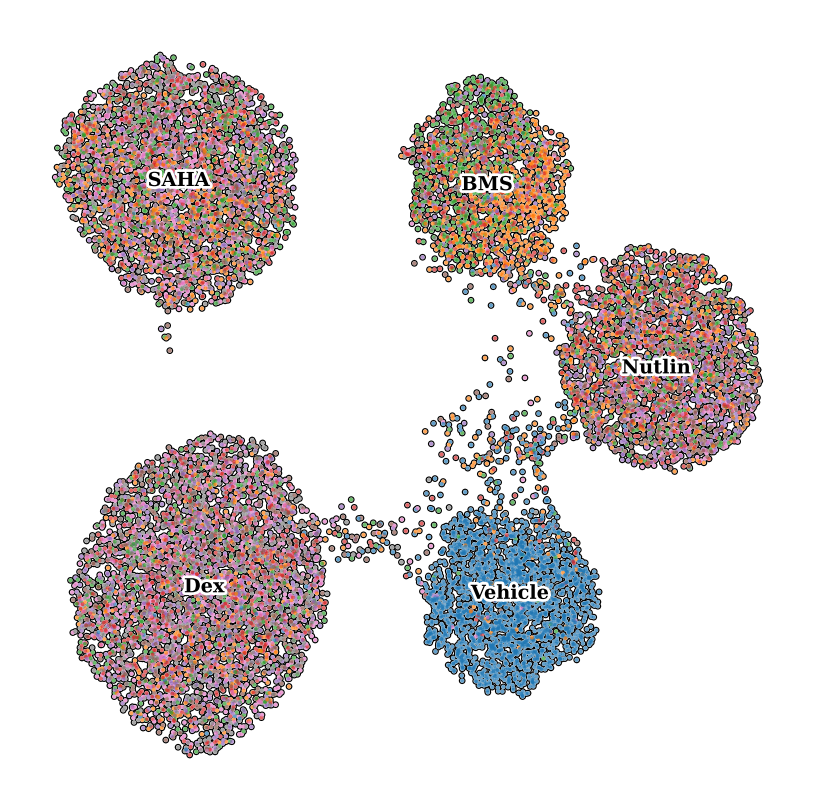

In [902]:
plt.figure(figsize=(5,5))
sc.pl.umap(
    latent,
    color=["dose"],
    ncols=2,
    color_map="gray",
    colorbar_loc=None,
    frameon=False,
    legend_fontsize="x-small",
    legend_loc=None,
    show=False,
    ax=plt.gca(),
    title="",
    add_outline=True,
)
sc.pl.umap(
    latent,
    color=["condition"],
    ncols=2,
    frameon=False,
    legend_fontsize="x-small",
    show=False,
    ax=plt.gca(),
    legend_loc="on data",
    legend_fontweight="semibold",
    legend_fontoutline=2,
    title="",
    add_outline=False,
    alpha=0
)
plt.show()

In [907]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.tl.pca(latent, n_comps=7)
sc.pp.neighbors(latent)
sc.tl.umap(latent)

computing PCA
    with n_comps=7
    finished (0:00:00)
computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:09)
